# Introduction

This is just a quick run through my solution for the Zindi competition. The solution was actually quite straightforward: It was an ensemble of LightGBM models from a 5-fold cross-validation. I find that tree boosting algorithms generally work well for tabular data - choose one and get very good at it is my dvise, [lightGBM](https://lightgbm.readthedocs.io/en/stable/) is quite easy. The trick I guess was getting the right hyperparamters for the models using optuna. For any bugs, issues, questions or comments please fill free to create an issue on this repo.
* [Github](https://github.com/SitwalaM)
* [Zindi](https://zindi.africa/users/Sitwala)

# Library Imports

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # statistical data visualization
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
from lightgbm import LGBMRegressor
import random
import os
import statistics
import warnings
warnings.filterwarnings('ignore')

In [ ]:
%%capture
!pip install optuna
import optuna
!pip install sweetviz
import optuna
import sweetviz as sv

In [ ]:
from google.colab import drive   # No need if not working from drive and colab as I was
drive.mount('/content/drive/')

Mounted at /content/drive/


# Data Imports and Exploration

Note that this import path is for my folder setup. Please change path to where your Train, Test and Graph datasets are. For a quick EDA I use a library called [sweetviz](https://pypi.org/project/sweetviz/). I would recommend a more exhaustive EDA for this challenge, but sweetviz worked well for limited time

In [ ]:
DATA_PATH = '/content/drive/MyDrive/Zindi/Zindi_folder' # change data path to your drive
# Load files
train = pd.read_csv(os.path.join(DATA_PATH, 'Train.csv'))
test = pd.read_csv(os.path.join(DATA_PATH, 'Test.csv'))
samplesubmission = pd.read_csv(os.path.join(DATA_PATH, 'SampleSubmission.csv'))
graph_df = pd.read_csv(os.path.join(DATA_PATH, 'Graph.csv'))

# Preview train dataset
train.head()

,ID,persistent_id,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,...,speed_avg_21_3_,speed_avg_22_0_,speed_avg_22_1_,speed_avg_22_2_,speed_avg_22_3_,speed_avg_23_0_,speed_avg_23_1_,speed_avg_23_2_,speed_avg_23_3_,target
0,269854886721865_X_first_holiday_X_evening_rush...,269854886721865,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,...,5.416564,NaN,NaN,23.384459,NaN,NaN,NaN,NaN,NaN,16.100915
1,11177137179841083456_X_first_holiday_X_evening...,11177137179841083456,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,...,10.500821,10.489071,10.137474,10.017406,10.913120,NaN,NaN,NaN,NaN,7.587891
2,633218125946609872_X_last_weekday_X_morning_ru...,633218125946609872,last_weekday,morning_rush_hour,NaN,NaN,NaN,NaN,0.000006,0.000016,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.103248
3,3800481098774106843_X_first_holiday_X_evening_...,3800481098774106843,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,...,14.259763,15.231057,14.893072,15.651930,14.149396,NaN,NaN,NaN,NaN,13.992048
4,210126283439727490_X_second_weekday_X_morning_...,210126283439727490,second_weekday,morning_rush_hour,0.000172,0.000198,0.000125,0.000116,0.000107,0.000081,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.889500


Let's create a function that will be used to Lookup from the graph.csv file that has more features

In [ ]:
def look_up_from_graph(train,graph,lookup_columns):
  # returns dataframe by looking up columns from the graph.csv

  train = train.copy()
  graph = graph.copy()

  train = train.merge(graph[lookup_columns], on = "persistent_id", how = "left")

  return train

"""
Save columns to lookup from the graph dataset, I found that these did not work well even thought they seem very useful -- they lead to overfitting quite easily didn't have time to investigate why this happened.
The best model should include at least a subset of these
"""
preliminary_columns = ["persistent_id","length", "speed_limit", "segments","category","is_residential", "traffic_side"]

train = look_up_from_graph(train,graph_df,preliminary_columns)
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18926 entries, 0 to 18925
Columns: 171 entries, ID to traffic_side
dtypes: bool(2), float64(163), int64(2), object(3), uint64(1)
memory usage: 24.6+ MB


In [ ]:
train.head()

,ID,persistent_id,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,...,speed_avg_23_1_,speed_avg_23_2_,speed_avg_23_3_,target,length,speed_limit,segments,category,is_residential,traffic_side
0,269854886721865_X_first_holiday_X_evening_rush...,269854886721865,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,16.100915,45.000000,NaN,1,3,False,True
1,11177137179841083456_X_first_holiday_X_evening...,11177137179841083456,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,7.587891,23.600000,NaN,2,2,False,True
2,633218125946609872_X_last_weekday_X_morning_ru...,633218125946609872,last_weekday,morning_rush_hour,NaN,NaN,NaN,NaN,0.000006,0.000016,...,NaN,NaN,NaN,12.103248,152.399994,NaN,1,2,False,True
3,3800481098774106843_X_first_holiday_X_evening_...,3800481098774106843,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,13.992048,101.300003,22.222222,1,4,False,True
4,210126283439727490_X_second_weekday_X_morning_...,210126283439727490,second_weekday,morning_rush_hour,0.000172,0.000198,0.000125,0.000116,0.000107,0.000081,...,NaN,NaN,NaN,14.889500,17.000000,16.666667,1,3,False,True


We sweetviz here for a quick EDA

                                             |          | [  0%]   00:00 -> (? left)


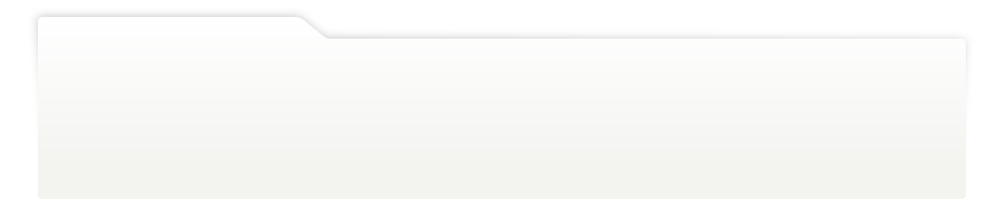
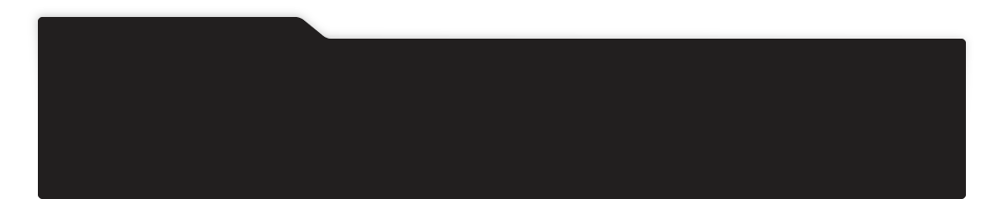
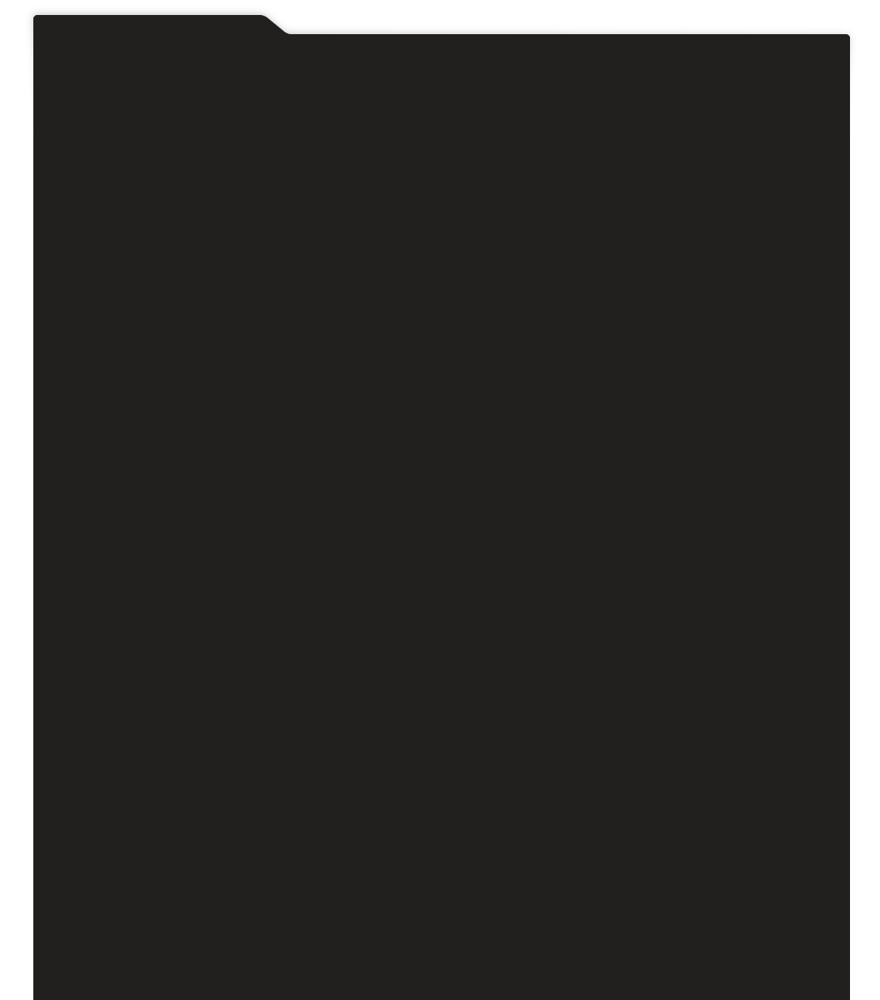
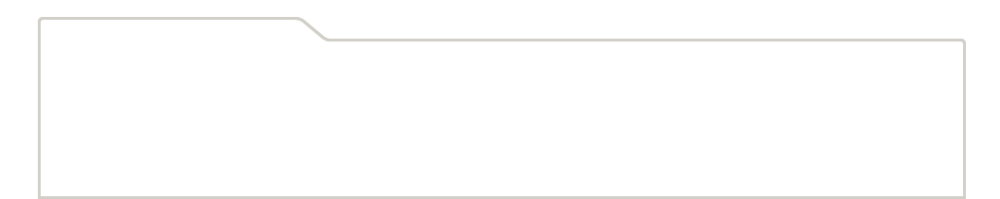
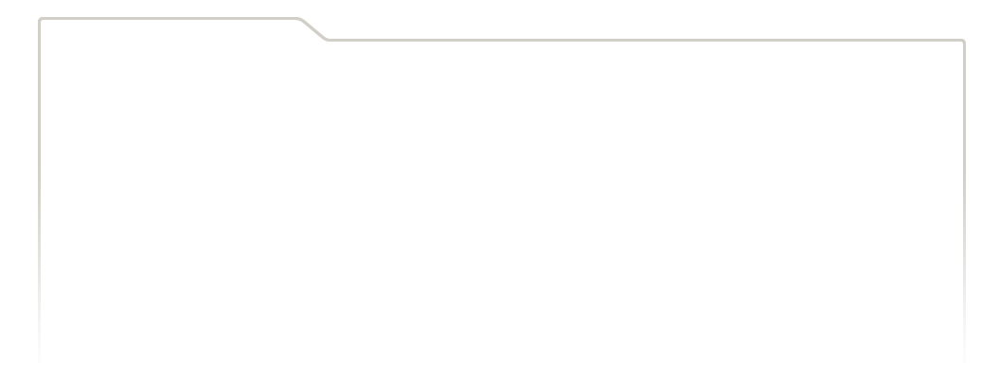
...
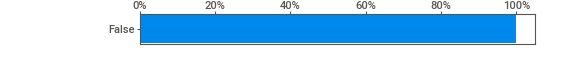
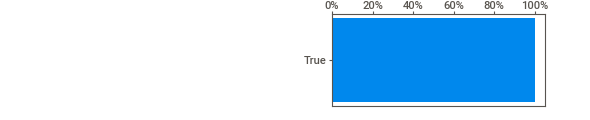
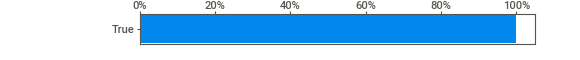
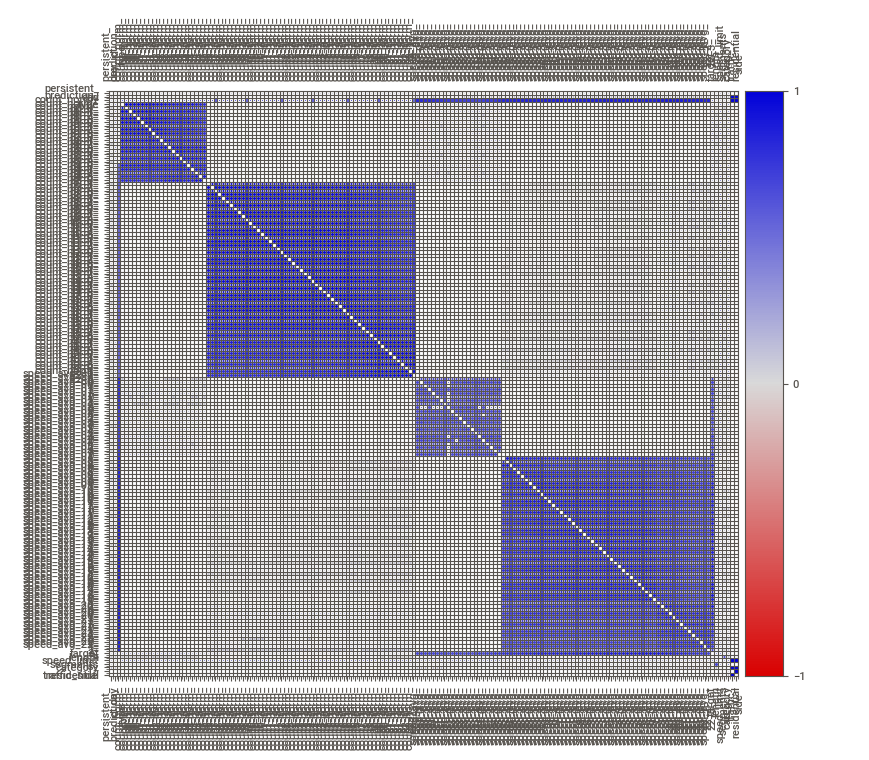
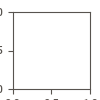

In [ ]:
my_report = sv.analyze(train)
my_report.show_notebook()

## Some quick Observations from the EDA above

* Lots of missing values in features, most around 50%, but we will let LightGBM deal with these
* The target has no outliers and seems to be normally distributed - this is a good thing. Using RMSE as the metric with outliers can be difficult to deal with.
* I was hoping "is_residential" feature would be useful, but looks like it's false for everything.
* The speed and count features are highly correlated with each other. Dropping some of these might be benefitial for the model. Experiment with this

In [ ]:
# Set seed for reproducability
SEED = 2023
random.seed(SEED)
np.random.seed(SEED)

# LGBM Baseline

## Preprocessing

Let's create a function that picks all our categorical features, we will need these for LightGBM.

In [ ]:
def change_object_to_cat(df):
  # changes objects columns to category and returns datframe and list

  df = df.copy()
  list_str_obj_cols = df.columns[df.dtypes == "object"].tolist()
  for str_obj_col in list_str_obj_cols:
      df[str_obj_col] = df[str_obj_col].astype("category")

  return df,list_str_obj_cols

In [ ]:
# get features and target
X =  train.drop(['ID', 'persistent_id', 'target'], axis = 1)
y = train.target

In [ ]:
X.head(3)

,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,count_norm_01_2_,count_norm_01_3_,...,speed_avg_23_0_,speed_avg_23_1_,speed_avg_23_2_,speed_avg_23_3_,length,speed_limit,segments,category,is_residential,traffic_side
0,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,45.000000,NaN,1,3,False,True
1,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,23.600000,NaN,2,2,False,True
2,last_weekday,morning_rush_hour,NaN,NaN,NaN,NaN,0.000006,0.000016,0.000001,0.000015,...,NaN,NaN,NaN,NaN,152.399994,NaN,1,2,False,True


In [ ]:
X,cat_list = change_object_to_cat(X)
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18926 entries, 0 to 18925
Columns: 168 entries, day to traffic_side
dtypes: bool(2), category(2), float64(162), int64(2)
memory usage: 23.9 MB


In [ ]:
cat_list

['day', 'prediction_type']

## Training -- Baseline

In [ ]:
# split the dataset into the training set and test set

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = 0)

Let's define a function that trains and returns the model, will be useful for cross vaalidation

In [ ]:
def lgbm_trainer(X_train,y_train, X_test, y_test, params, num_round,categorical):

  train_data = lgb.Dataset(X_train, y_train, feature_name = X_train.columns.tolist(), categorical_feature =categorical, free_raw_data=False )
  validation_data = lgb.Dataset(X_test, y_test, feature_name = X_train.columns.tolist(), categorical_feature =categorical, free_raw_data=False)

  num_round = num_round
  eval_result = {}
  bst = lgb.train(param, train_data, num_round, valid_sets=[train_data, validation_data],
                  callbacks=[lgb.early_stopping(stopping_rounds=15), lgb.log_evaluation(100),  lgb.record_evaluation(eval_result)])
  return bst

In [ ]:
# we start with default parameters and just define the objective metric
param = {"verbose": -100}
param['metric'] = 'rmse'

# lists to save metrics and predictions from the fold

def cv_train(X_train,y_train,params,num_rounds,category):
  # function to do 5-fold cross validation
  # returns the out of fold validation score and models from the CV

  kf = KFold(n_splits=5,random_state=48,shuffle=True)
  rmses = []
  y_vals =[]
  y_hats = []
  models = []
  for trn_idx, test_idx in kf.split(X_train, y_train):
      X_tr,X_val=X_train.iloc[trn_idx],X_train.iloc[test_idx]
      y_tr,y_val=y_train.iloc[trn_idx],y_train.iloc[test_idx]
      cls = lgbm_trainer(X_tr,y_tr, X_val, y_val, params, num_rounds, cat_list)
      models.append(cls)
      y_hat = cls.predict(X_val, num_iteration=cls.best_iteration)
      rmse = mean_squared_error(y_val, y_hat, squared = False)
      rmses.append(rmse)
  mean_rmse = statistics.mean(rmses)
  print("mean rmse: {}".format(mean_rmse))
  return mean_rmse, models

rmse, models =cv_train(X_train,y_train,param,1000,cat_list)
print(rmse)

Training until validation scores don't improve for 15 rounds
[100]	training's rmse: 1.46345	valid_1's rmse: 1.71563
[200]	training's rmse: 1.23808	valid_1's rmse: 1.64224
[300]	training's rmse: 1.08797	valid_1's rmse: 1.61161
[400]	training's rmse: 0.989896	valid_1's rmse: 1.59389
Early stopping, best iteration is:
[463]	training's rmse: 0.936106	valid_1's rmse: 1.58559
Training until validation scores don't improve for 15 rounds
[100]	training's rmse: 1.42164	valid_1's rmse: 1.92903
[200]	training's rmse: 1.17592	valid_1's rmse: 1.84306
[300]	training's rmse: 1.03305	valid_1's rmse: 1.79418
[400]	training's rmse: 0.927723	valid_1's rmse: 1.76983
Early stopping, best iteration is:
[403]	training's rmse: 0.924507	valid_1's rmse: 1.7693
Training until validation scores don't improve for 15 rounds
[100]	training's rmse: 1.45327	valid_1's rmse: 1.70249
[200]	training's rmse: 1.22298	valid_1's rmse: 1.63788
[300]	training's rmse: 1.08285	valid_1's rmse: 1.60671
[400]	training's rmse: 0.9800

We have a cross validation score of 1.53 when we use the mean fold predictions, which is really good, let's see if we can improve this

## Check feature importance with using Shap Values

In [ ]:
%%capture
!pip install shap
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(models[0])

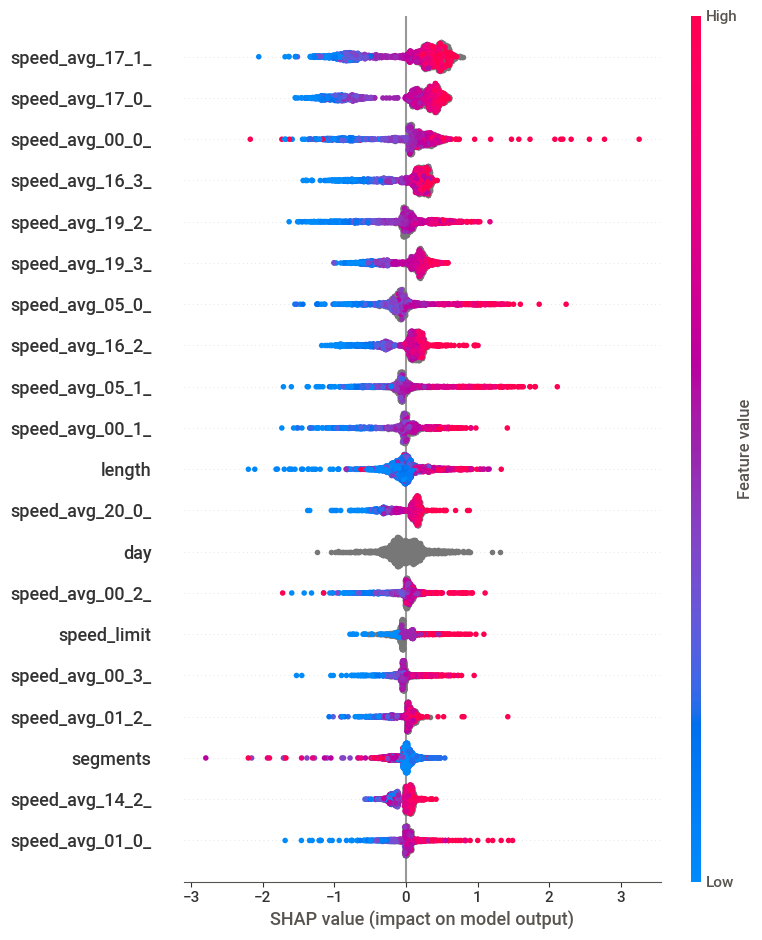

In [ ]:
shap_values = explainer.shap_values(X_test)
# Summarize the effects of features
shap.summary_plot(shap_values, X_test)

In [ ]:
import numpy as np
vals= np.abs(shap_values).mean(0)

feature_importance = pd.DataFrame(list(zip(X_test.columns.tolist(), vals)), columns=['col_name','feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'], ascending=False,inplace=True)
feature_importance.head()

,col_name,feature_importance_vals
143,speed_avg_17_1_,0.475650
142,speed_avg_17_0_,0.459245
82,speed_avg_00_0_,0.314499
141,speed_avg_16_3_,0.272392
144,speed_avg_19_2_,0.256971


<Axes: >

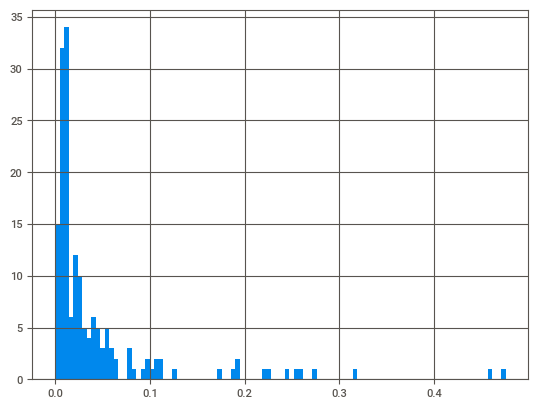

In [ ]:
feature_importance.feature_importance_vals.hist(bins = 100)

In [ ]:
# We try to remove some features with less importance here

filtered_features = feature_importance[feature_importance["feature_importance_vals"]> 0.2].col_name.unique().tolist()


In [ ]:
param = {"verbose": -100}
param['metric'] = 'rmse'
X_new, cat_list_filt = change_object_to_cat(X_train)
rmse, models =cv_train(X_new,y_train,param,1000,cat_list_filt)
print(rmse)

Training until validation scores don't improve for 15 rounds
[100]	training's rmse: 1.46345	valid_1's rmse: 1.71563
[200]	training's rmse: 1.23808	valid_1's rmse: 1.64224
[300]	training's rmse: 1.08797	valid_1's rmse: 1.61161
[400]	training's rmse: 0.989896	valid_1's rmse: 1.59389
Early stopping, best iteration is:
[463]	training's rmse: 0.936106	valid_1's rmse: 1.58559
Training until validation scores don't improve for 15 rounds
[100]	training's rmse: 1.42164	valid_1's rmse: 1.92903
[200]	training's rmse: 1.17592	valid_1's rmse: 1.84306
[300]	training's rmse: 1.03305	valid_1's rmse: 1.79418
[400]	training's rmse: 0.927723	valid_1's rmse: 1.76983
Early stopping, best iteration is:
[403]	training's rmse: 0.924507	valid_1's rmse: 1.7693
Training until validation scores don't improve for 15 rounds
[100]	training's rmse: 1.45327	valid_1's rmse: 1.70249
[200]	training's rmse: 1.22298	valid_1's rmse: 1.63788
[300]	training's rmse: 1.08285	valid_1's rmse: 1.60671
[400]	training's rmse: 0.9800

Experimenting with removing features didn't seem to change much which I found strange - can check if there's a bug here

# Hyperparameter Optimization with Optuna

In [ ]:
%%capture
def objective(trial):

  params = {
        'metric': 'rmse',
        'random_state': 48,
        'verbose': -1,
        'feature_fraction': trial.suggest_float("feature_fraction", 0.1, 1.0, log=True),
        'learning_rate': trial.suggest_float("learning_rate", 0.01, 1.0, log=True),
        'num_leaves' : trial.suggest_int('num_leaves', 1, 500),
        'max_depth': trial.suggest_categorical('max_depth', [10,20,50,100,300,400,500,1000])}

  rmse, _ =cv_train(X_train,y_train,params,1000,cat_list)

  return rmse

study = optuna.create_study(direction='minimize', study_name = "first", load_if_exists = "True")
study.optimize(objective, n_trials=1) # put one  trial so it shouldn't run for long
study.best_params

Got a slight boost from optuna to 1.649.. rmse. We will use these parameters for final models

In [ ]:
fig = optuna.visualization.plot_optimization_history(study)
fig.show()


# Model 5-fold with the best Parameters

#best so far
{'feature_fraction': 0.3154104713730906,
 'learning_rate': 0.15896670659672937,
 'num_leaves': 239,
 'max_depth': 10}

In [ ]:
"""
Each model in the five fold predicts an output for the test dataset => Used the mean and the median => found these results to be quite close.
 What would improve results is optimizing the weights of each of the models are some of them are better than others
"""

'\nEach model in the five fold predicts an output for the test dataset => Used the mean and the median => found these results to be quite close.\n What would improve results is optimizing the weights of each of the models are some of them are better than others\n'

In [ ]:

# best model parameters -- leading
kf = KFold(n_splits=5,random_state=48,shuffle=True)
param = {'feature_fraction': 0.23935057800657503,
        'learning_rate': 0.018513550260810092,
         'objective': 'regression',
         "n_estimators": 1000,
        'num_leaves': 163,
        'max_depth': 10}

param['metric'] = 'rmse'
param['random_state'] = 48

rmse, models =cv_train(X_train,y_train,param,1000,cat_list)
print(rmse)
print(models)

## Predict on Test Set

In [ ]:
# Make prediction on the test set
DATA_PATH = '/content/drive/MyDrive/Zindi/Zindi_folder'
test = pd.read_csv(os.path.join(DATA_PATH, 'Test.csv'))
test_df = test.copy()

# Preprocess the dataset to match train set
test_df = look_up_from_graph(test_df,graph_df,preliminary_columns)
test_df = test_df[X_train.columns.tolist()]
test_df,_ = change_object_to_cat(test_df)
pred_df = test_df.copy()

# Oredict using all five models from CV
for i,model in enumerate(models):   # use models saved in the list to predict
  pred_df["pred_{}".format(i)] = model.predict(test_df, num_iteration=model.best_iteration)
pred_df.head()

,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,count_norm_01_2_,count_norm_01_3_,...,speed_limit,segments,category,is_residential,traffic_side,pred_0,pred_1,pred_2,pred_3,pred_4
0,second_weekday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,16.666667,1,3,False,True,11.003406,11.004452,11.004478,11.145606,11.009402
1,last_weekday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,16.666667,3,3,False,True,8.124429,8.176748,8.207138,8.083911,8.113160
2,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.111111,1,3,False,True,14.668357,14.690532,14.843613,14.663748,14.875028
3,last_weekday,morning_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,2,False,True,18.348909,16.832305,18.114614,17.114827,17.970762
4,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,22.222222,2,3,False,True,12.504675,12.903903,12.412442,13.015907,12.676582


In [ ]:
# Calculate mean and median of the predictions from the models

sub_df = pred_df.copy()
sub_df["mean_pred"] = pred_df.iloc[:,-5:].mean(axis =1)      # Add mean of model predictions
sub_df["median_pred"] = pred_df.iloc[:,-5:].median(axis =1)  # Add median of model predictions
sub_df.head()

,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,count_norm_01_2_,count_norm_01_3_,...,category,is_residential,traffic_side,pred_0,pred_1,pred_2,pred_3,pred_4,mean_pred,median_pred
0,second_weekday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3,False,True,11.003406,11.004452,11.004478,11.145606,11.009402,11.033469,11.004478
1,last_weekday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3,False,True,8.124429,8.176748,8.207138,8.083911,8.113160,8.141077,8.124429
2,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3,False,True,14.668357,14.690532,14.843613,14.663748,14.875028,14.748256,14.690532
3,last_weekday,morning_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2,False,True,18.348909,16.832305,18.114614,17.114827,17.970762,17.676283,17.970762
4,first_holiday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3,False,True,12.504675,12.903903,12.412442,13.015907,12.676582,12.702701,12.676582


In [ ]:
# # Create a submission file
sub_file = pd.DataFrame({'ID': test.ID, 'target': sub_df.mean_pred})  # change median and mean here
sub_file.to_csv('lgbm_ensemble_mean_check_repeatable.csv', index = False)
sub_file.head()

,ID,target
0,5405080210124813414_X_second_weekday_X_evening...,11.033469
1,6453542591505456860_X_last_weekday_X_evening_r...,8.141077
2,6407212708693425720_X_first_holiday_X_evening_...,14.748256
3,6760475269129354863_X_last_weekday_X_morning_r...,17.676283
4,1401737811576794421_X_first_holiday_X_evening_...,12.702701


The submission file here should score quite highly on the LB. You can experiment more with features and run optimizations for longer to find the best parameters